In [1]:
import ast
import random

In [2]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate

In [3]:
f3 = pd.read_csv('fold3_discrepancy.csv')

In [71]:
[k for k in SIZE_MAP.keys()]

['ETT - Abnormal',
 'ETT - Borderline',
 'ETT - Normal',
 'NGT - Abnormal',
 'NGT - Borderline',
 'NGT - Incompletely Imaged',
 'NGT - Normal',
 'CVC - Abnormal',
 'CVC - Borderline',
 'CVC - Normal',
 'Swan Ganz Catheter Present']

In [4]:
seg_df = pd.read_csv('train_annotations.csv')
img_dir = 'train'

In [65]:
annot_size = 20
SIZE_MAP = {
    'ETT - Abnormal': 3,
    'ETT - Borderline': 2,
    'ETT - Normal': 1,
    'NGT - Abnormal': 3,
    'NGT - Borderline': 2,
    'NGT - Incompletely Imaged': 1,
    'NGT - Normal': 1,
    'CVC - Abnormal': 3,
    'CVC - Borderline': 2,
    'CVC - Normal': 1,
    'Swan Ganz Catheter Present': 1,
}
COLOR_MAP = {
    'ETT - Abnormal': (1,1,0),
    'ETT - Borderline': (.7,.7,0),
    'ETT - Normal': (.5,.5,0),
    #
    'NGT - Abnormal': (0,1,1),
    'NGT - Borderline': (0,1,1),
    'NGT - Incompletely Imaged': (0,1,1),
    'NGT - Normal': (0,1,1),
    #
    'CVC - Abnormal': (0,0,1),
    'CVC - Borderline': (0,.7,.7),
    'CVC - Normal': (0,.5,.5),
    #
    'Swan Ganz Catheter Present': (0,1,0),
}

In [6]:
def get_point(chosen, seg_df):
    points = []
    for i, point in enumerate(seg_df.iloc[chosen,2].split('],')):
        if i==len(seg_df.iloc[chosen,2].split('],'))-1:
            xy = tuple([int(x) for x in point[2:-2].split(', ')])
            print(xy)
            points.append(xy)
        else:
            xy = tuple([int(x) for x in point[2:].split(', ')])
            print(xy)
            points.append(xy)
    return points

In [7]:
from PIL import ImageDraw
from PIL import Image

def draw_point(points, img):
    draw = ImageDraw.Draw(img)
    draw.line(points, fill=255, width=5)
    for point in points:
        draw.ellipse([(point[0]-2, point[1]-2), (point[0]+2, point[1]+2)], fill='white')
    plt.imshow(img, cmap='gray')

In [8]:
chosen = seg_df.loc[seg_df['label']=='CVC - Normal'].index.values[0]


In [ ]:
f3dir = 'E:/dev/ranzcr/f3/'
import os, json

for ff in os.listdir(f3dir):
    if('json' in ff):
        if(seg_df[seg_df['StudyInstanceUID']==ff[:-5]].empty):
            data = json.load(open(f3dir + ff, 'r'))

NGT - Borderline
CVC - Normal
NGT - Normal
CVC - Abnormal


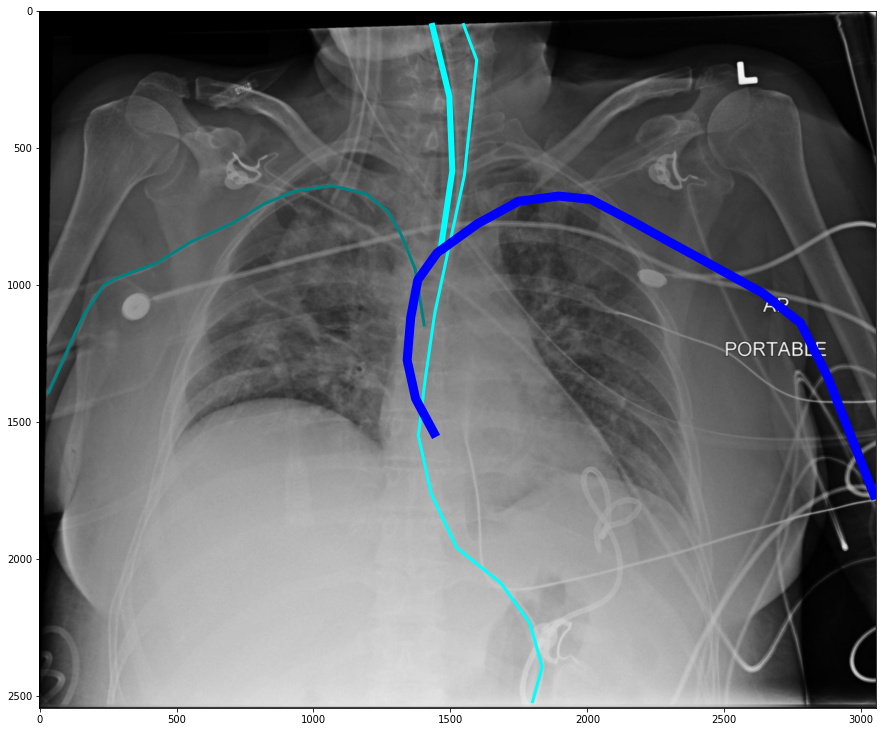

CVC - Normal
CVC - Normal
NGT - Incompletely Imaged


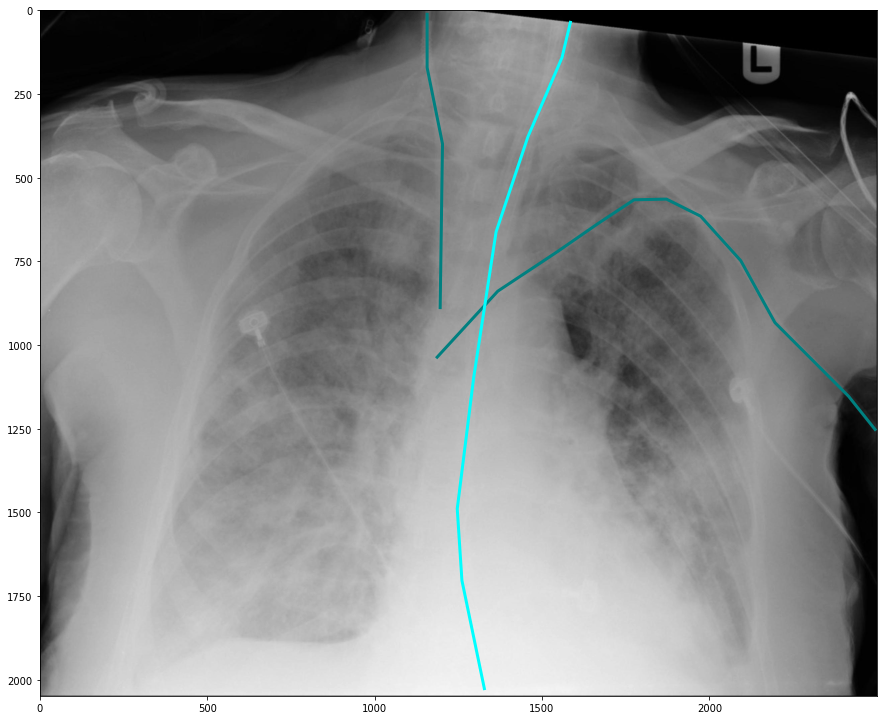

CVC - Normal


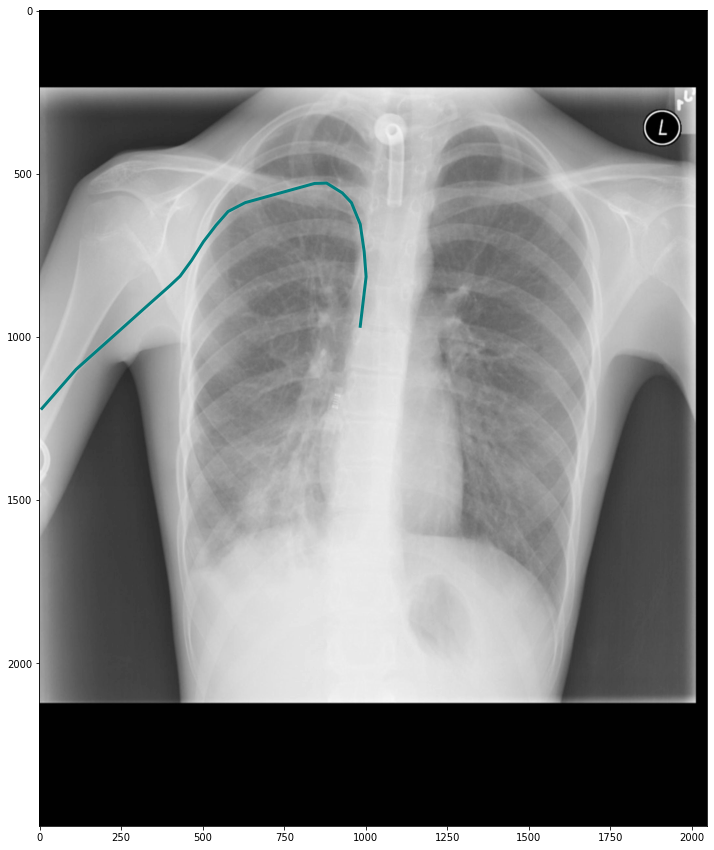

NGT - Normal
CVC - Borderline


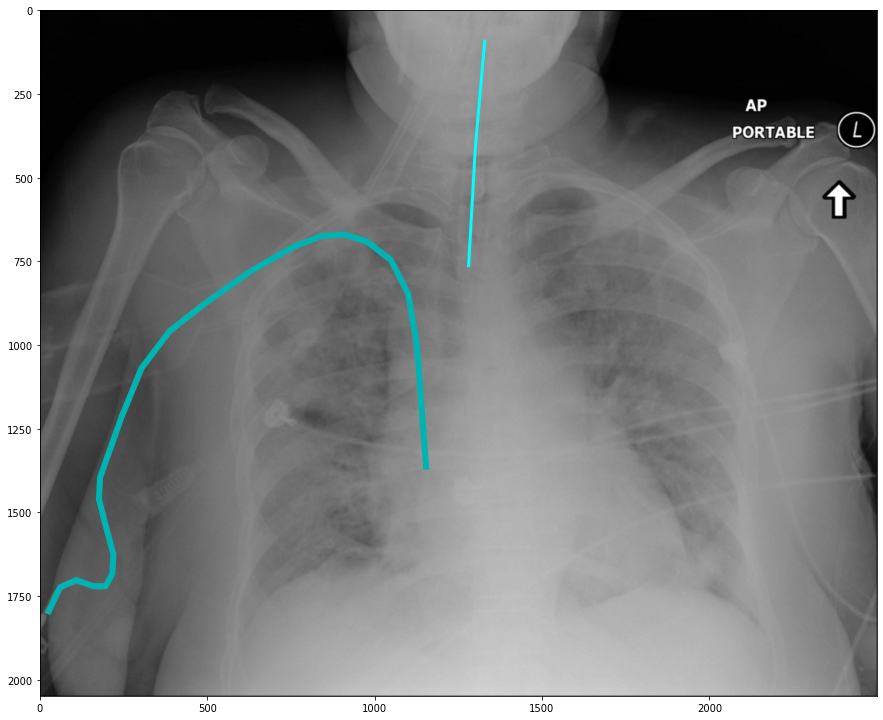

CVC - Normal


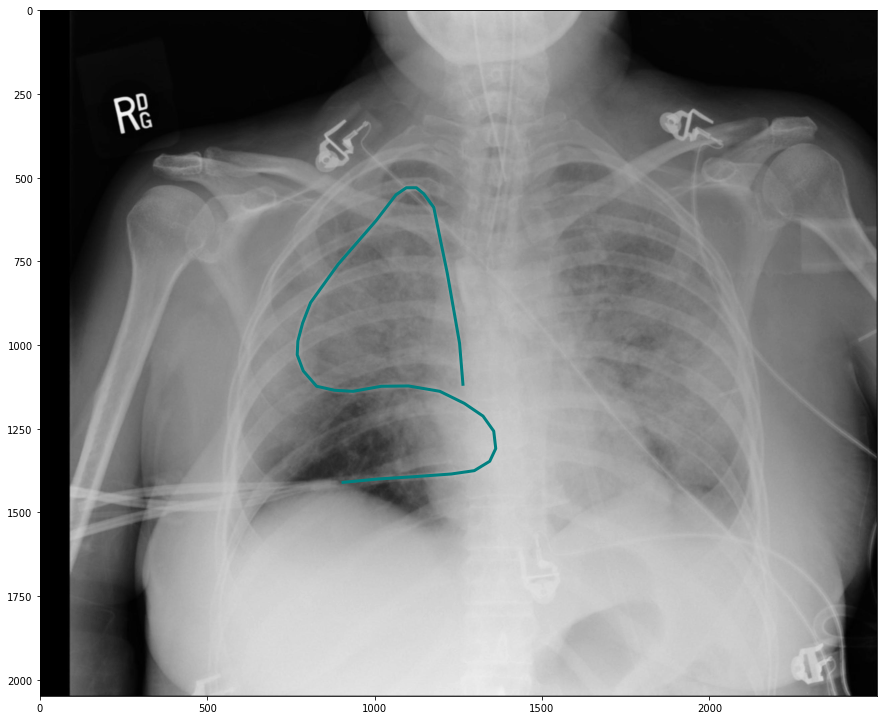

CVC - Normal
NGT - Normal
ETT - Normal


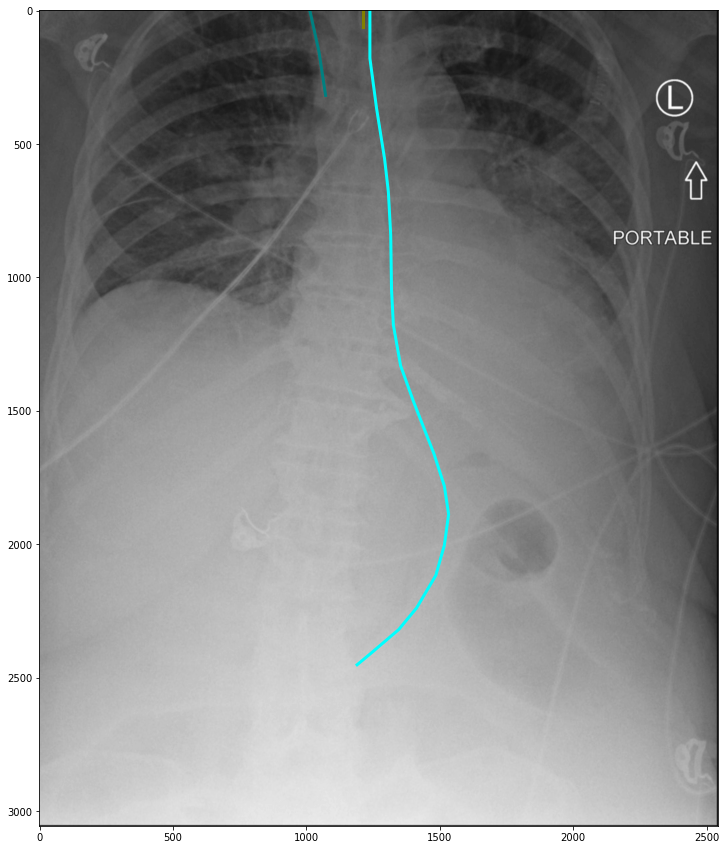

f3/1.2.826.0.1.3680043.8.498.10389805790263741980729617685089529865.json
ETT - Borderline
f3/1.2.826.0.1.3680043.8.498.10389805790263741980729617685089529865.json
Swan Ganz Catheter Present
f3/1.2.826.0.1.3680043.8.498.10389805790263741980729617685089529865.json
NGT - Incompletely Imaged
f3/1.2.826.0.1.3680043.8.498.10389805790263741980729617685089529865.json
CVC - Borderline


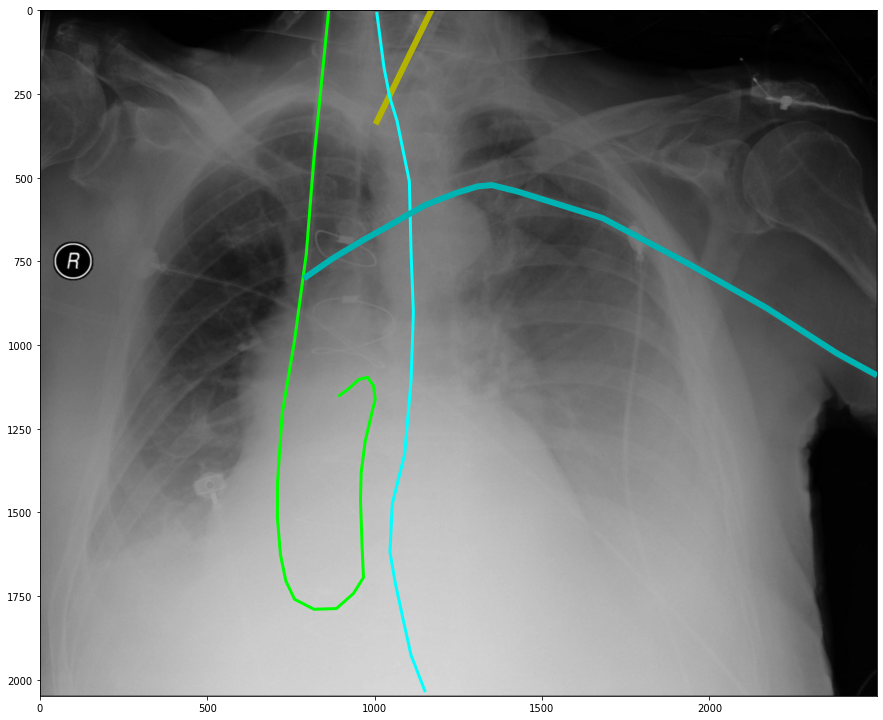

ETT - Borderline
CVC - Borderline
Swan Ganz Catheter Present
NGT - Abnormal


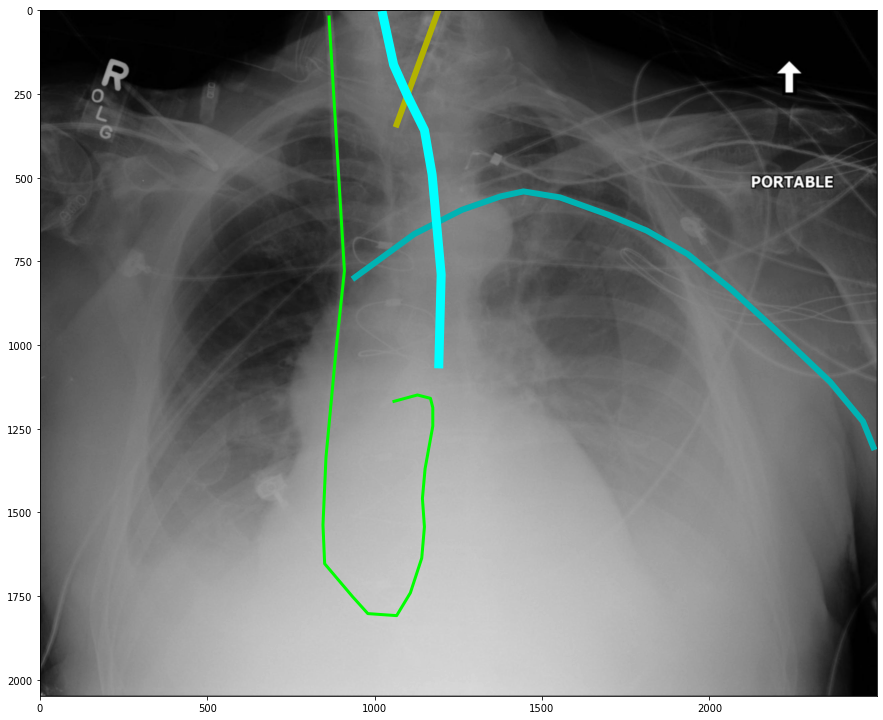

CVC - Abnormal
CVC - Borderline
ETT - Normal


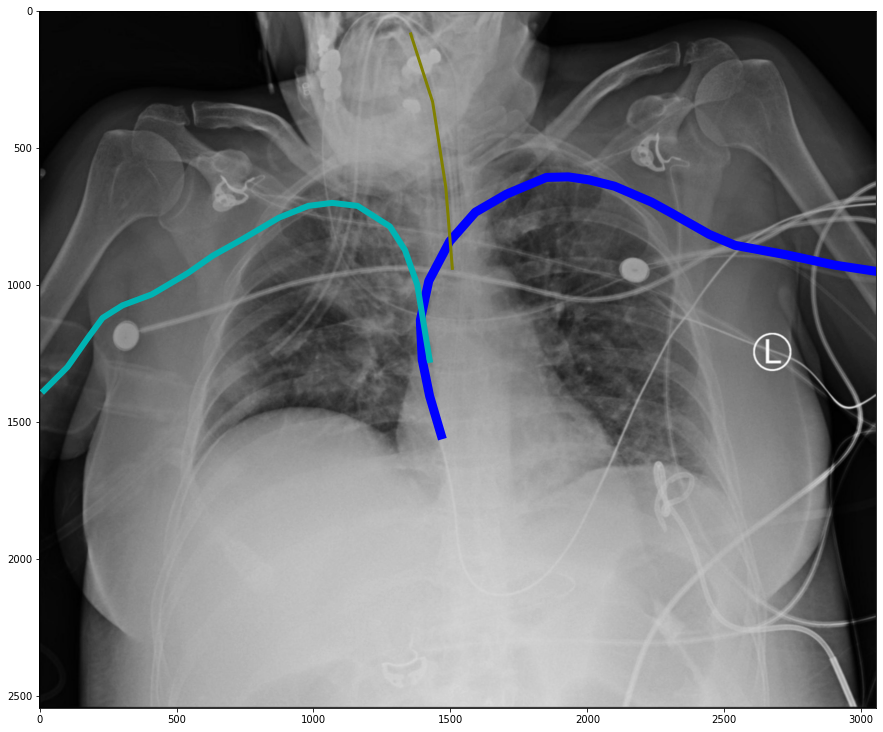

ETT - Normal
CVC - Abnormal
CVC - Normal


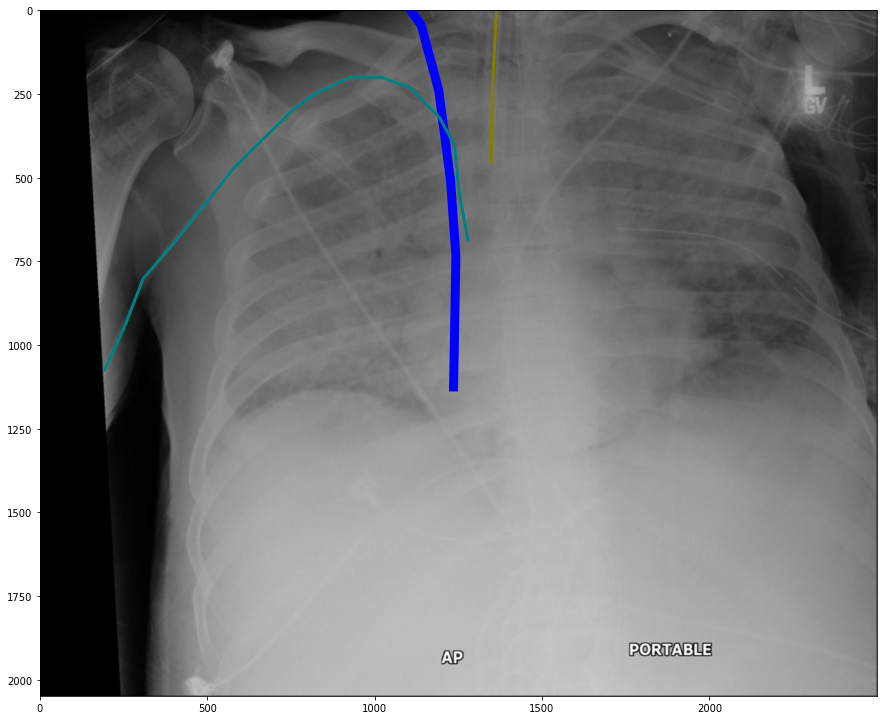

CVC - Normal
CVC - Normal
NGT - Normal


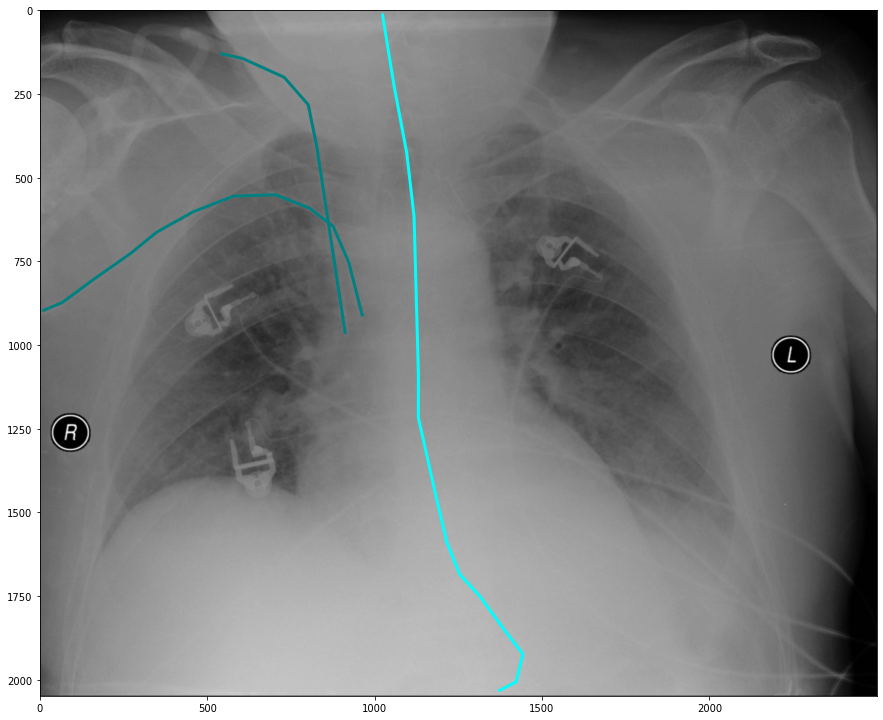

NGT - Normal
CVC - Borderline


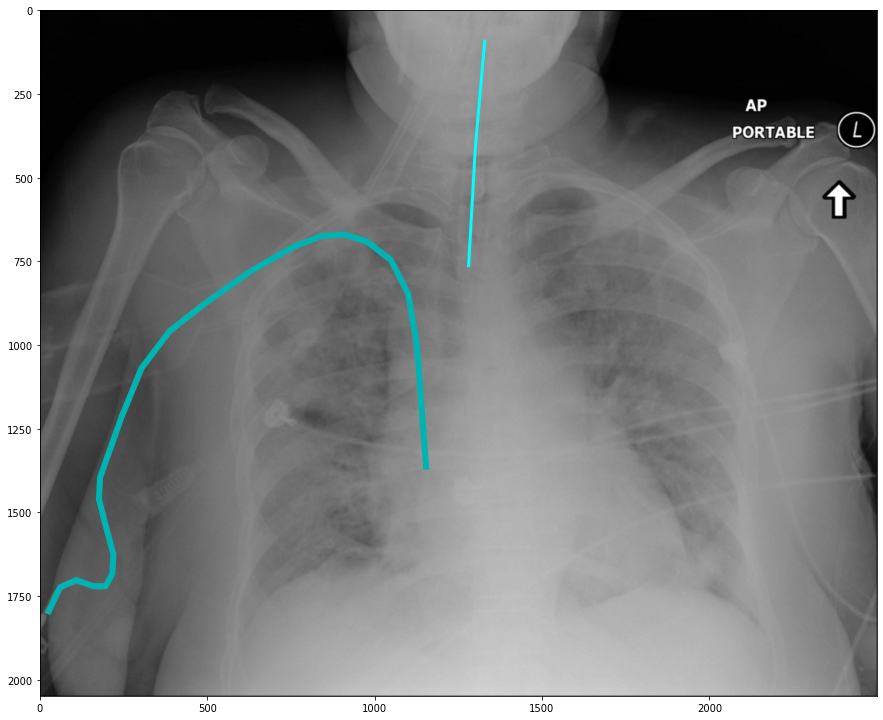

Swan Ganz Catheter Present
ETT - Normal
NGT - Normal


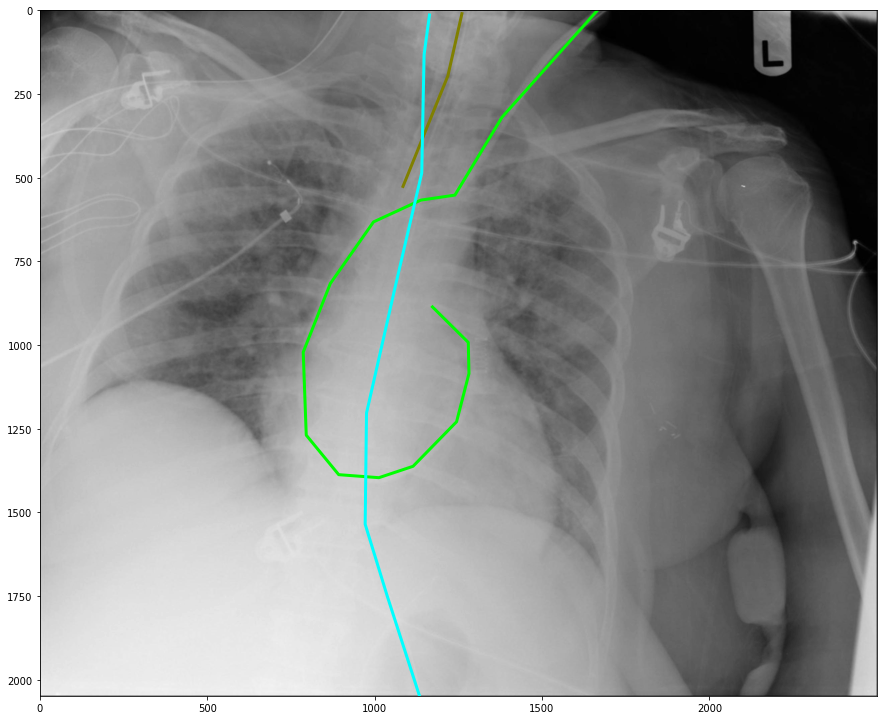

ETT - Normal


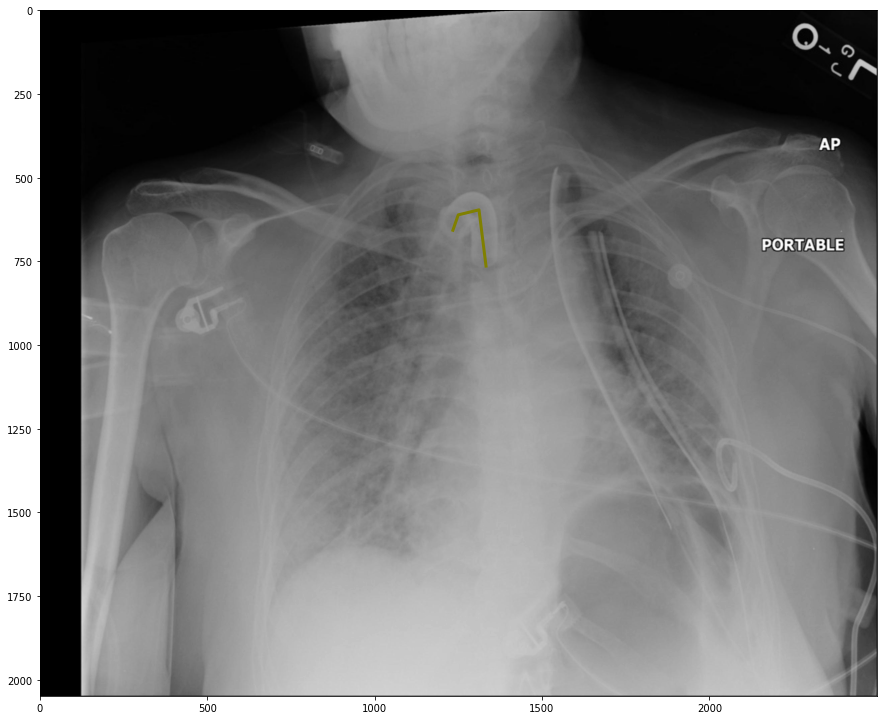

Swan Ganz Catheter Present
ETT - Normal
NGT - Incompletely Imaged


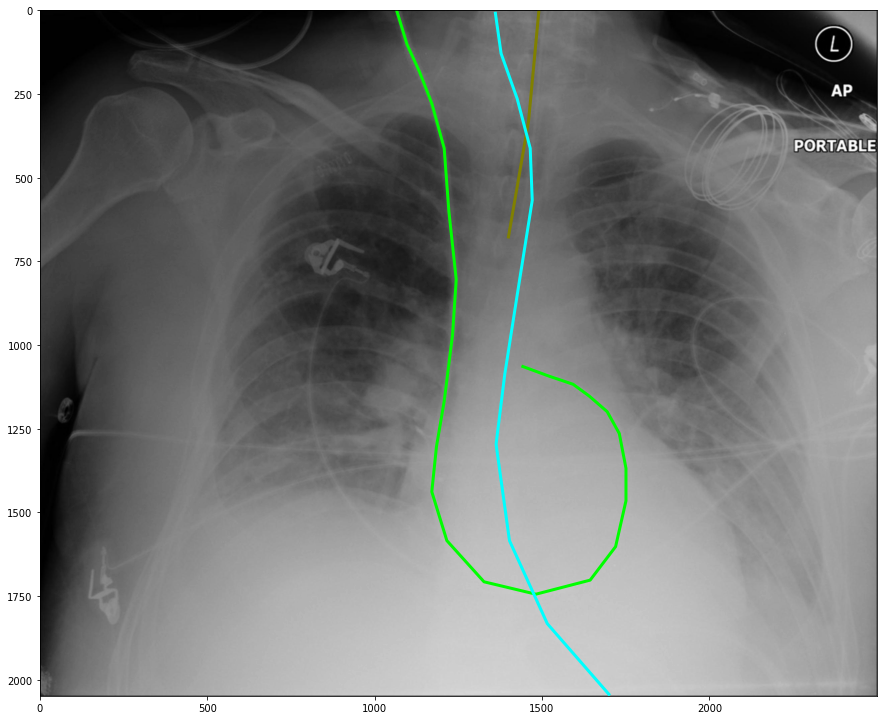

NGT - Abnormal
ETT - Normal
CVC - Borderline


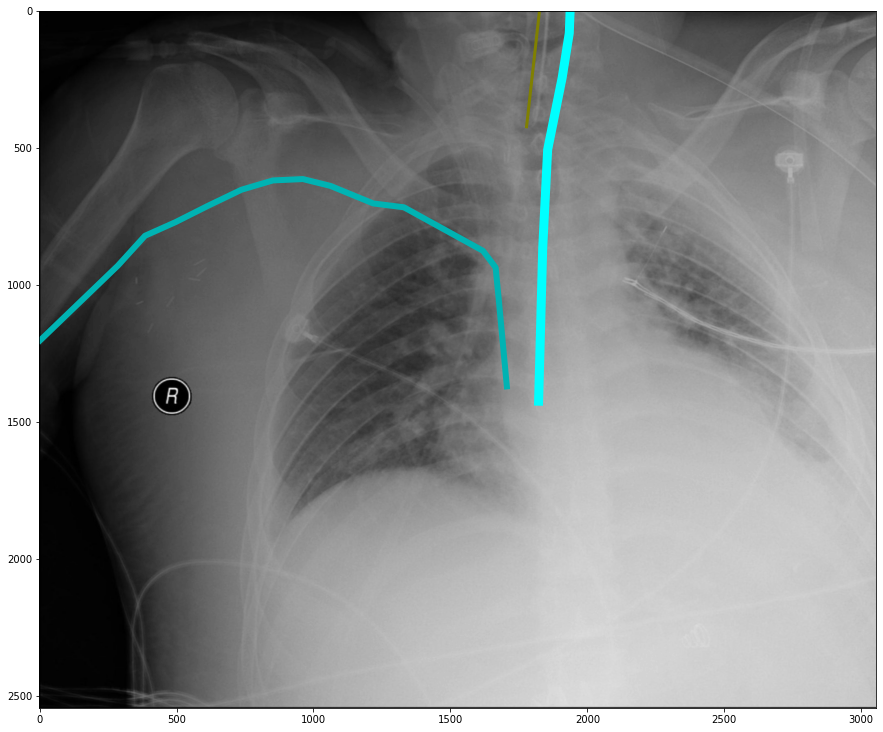

ETT - Normal
CVC - Normal
CVC - Normal
NGT - Normal


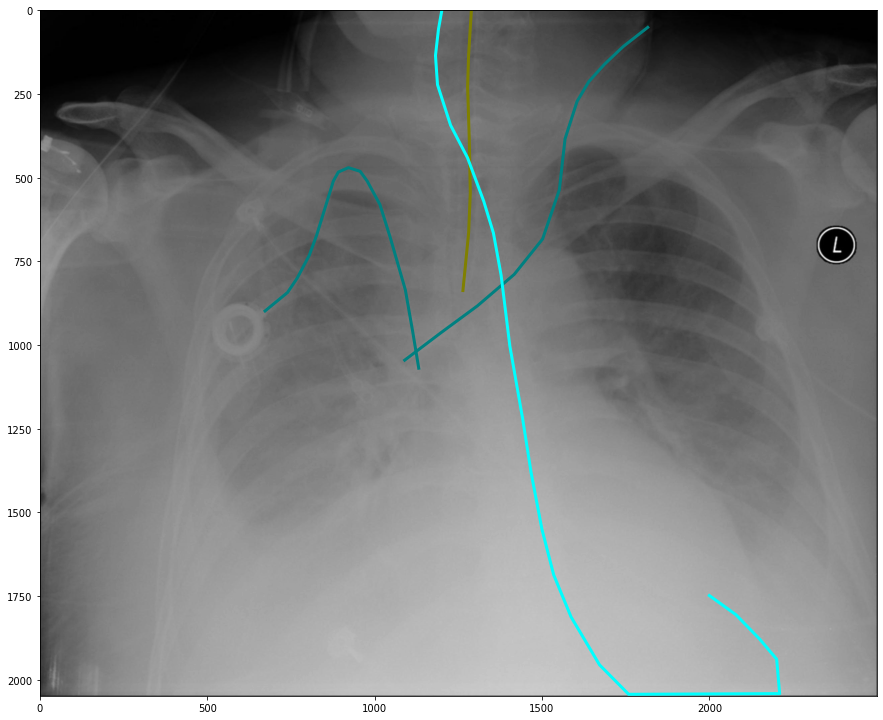

f3/1.2.826.0.1.3680043.8.498.12210806397399784271927859903998103679.json
CVC - Normal
f3/1.2.826.0.1.3680043.8.498.12210806397399784271927859903998103679.json
CVC - Normal


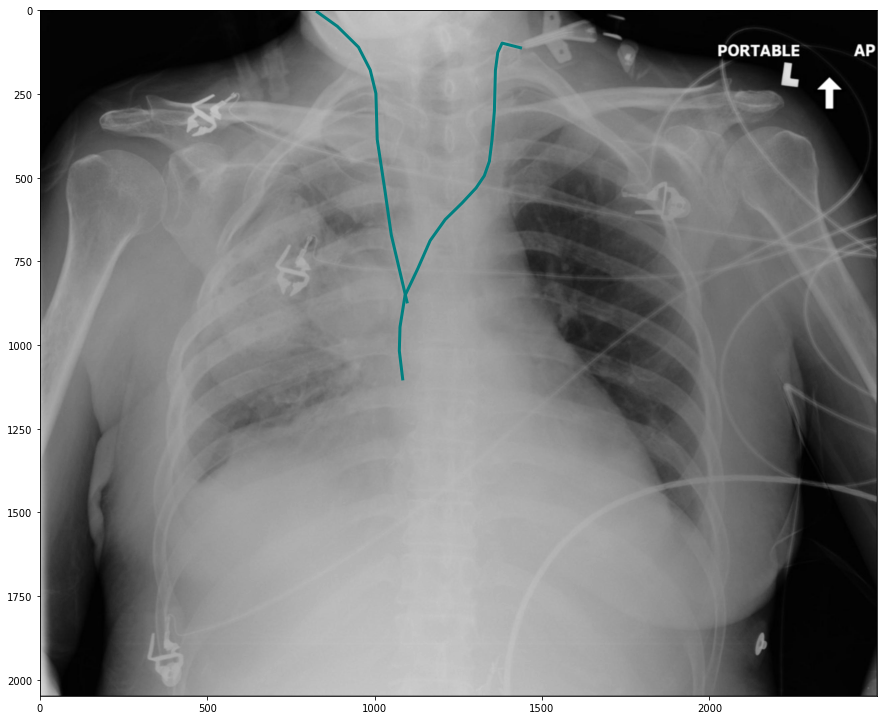

ETT - Normal
NGT - Incompletely Imaged
CVC - Normal
CVC - Normal
CVC - Normal


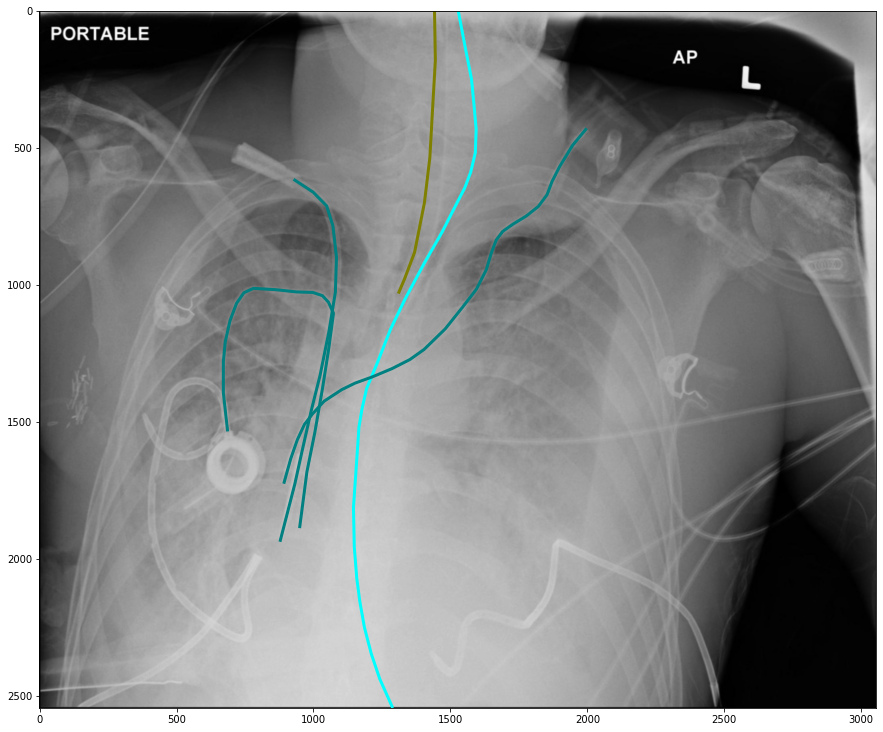

f3/1.2.826.0.1.3680043.8.498.10133976072102544942180767916216416403.json
CVC - Borderline
f3/1.2.826.0.1.3680043.8.498.10133976072102544942180767916216416403.json
CVC - Borderline


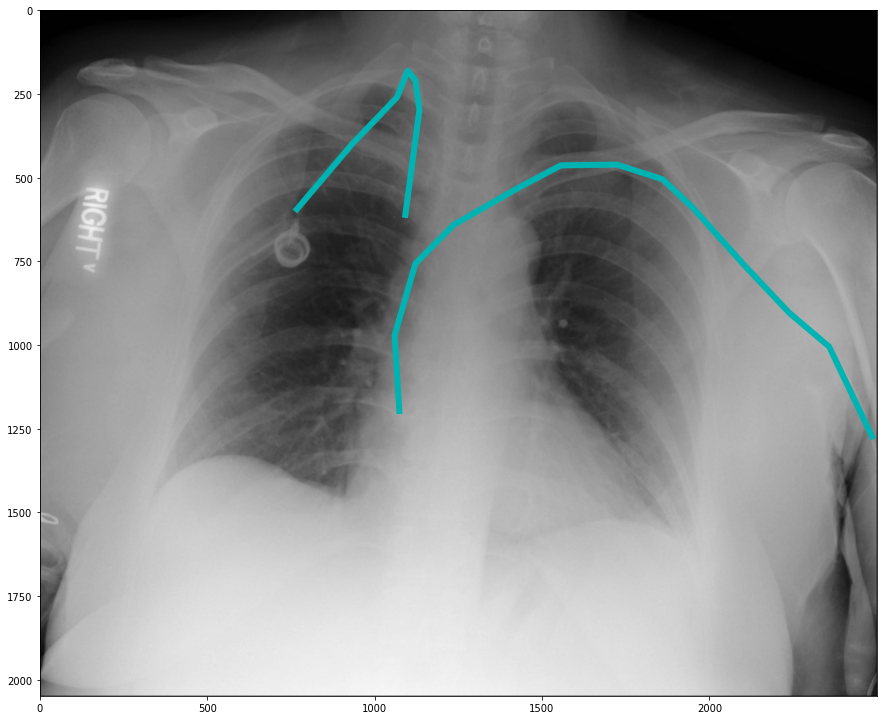

NGT - Normal
ETT - Normal
CVC - Normal
CVC - Normal


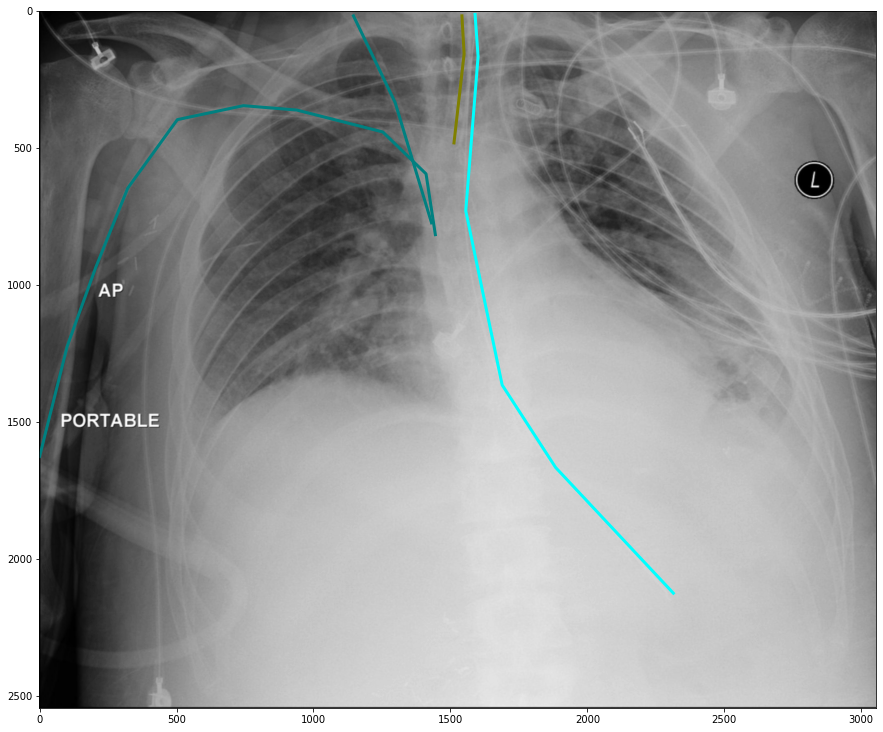

ETT - Normal
NGT - Incompletely Imaged
CVC - Borderline
CVC - Borderline
CVC - Borderline


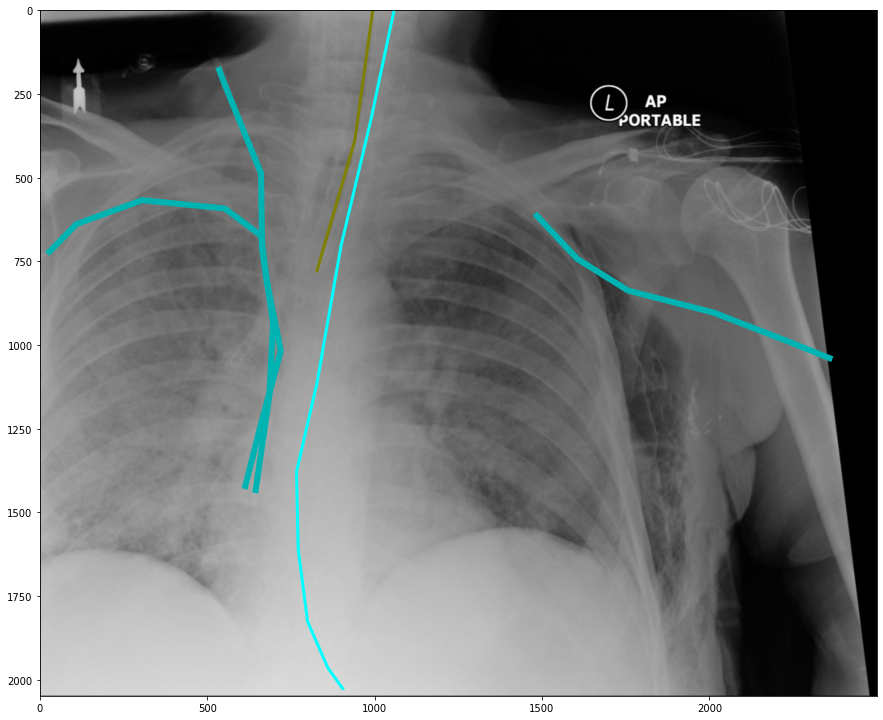

f3/1.2.826.0.1.3680043.8.498.12964259290203302237549818969627159972.json
CVC - Normal
f3/1.2.826.0.1.3680043.8.498.12964259290203302237549818969627159972.json
CVC - Normal


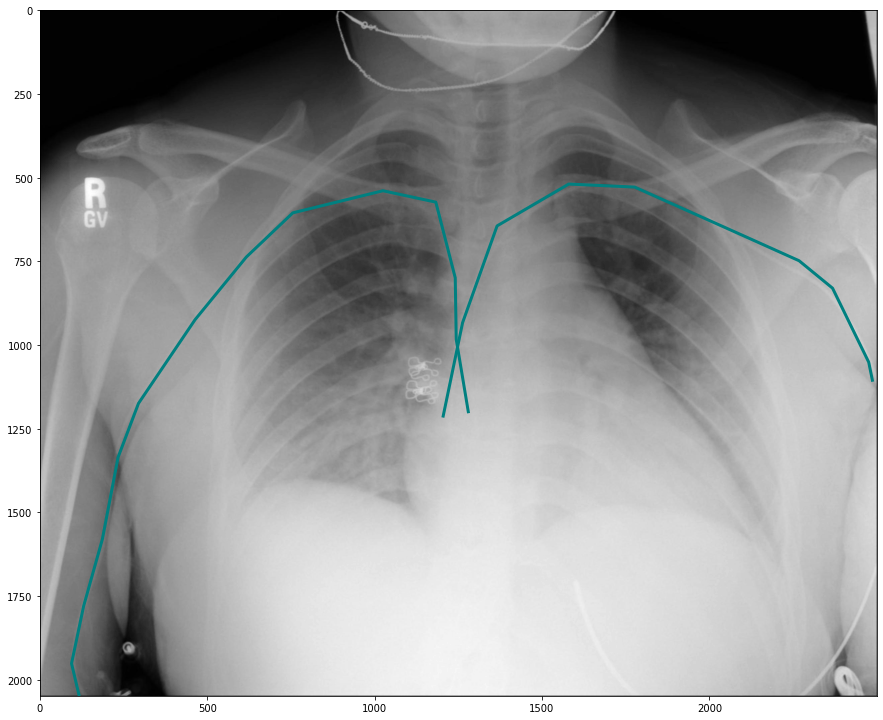

ETT - Borderline
NGT - Borderline
CVC - Borderline
CVC - Borderline


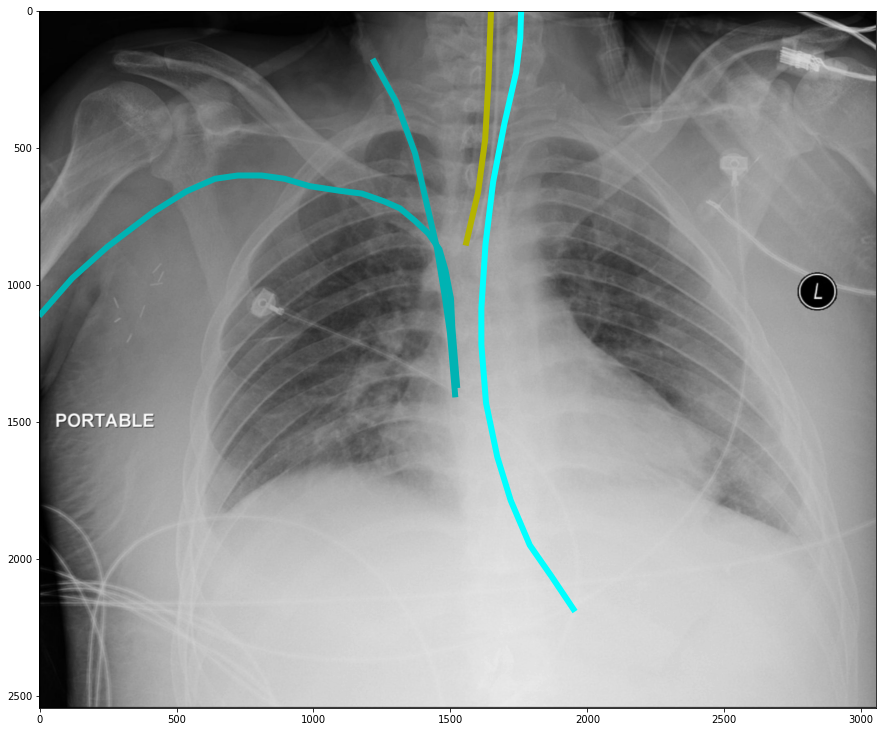

ETT - Normal
CVC - Normal
CVC - Normal


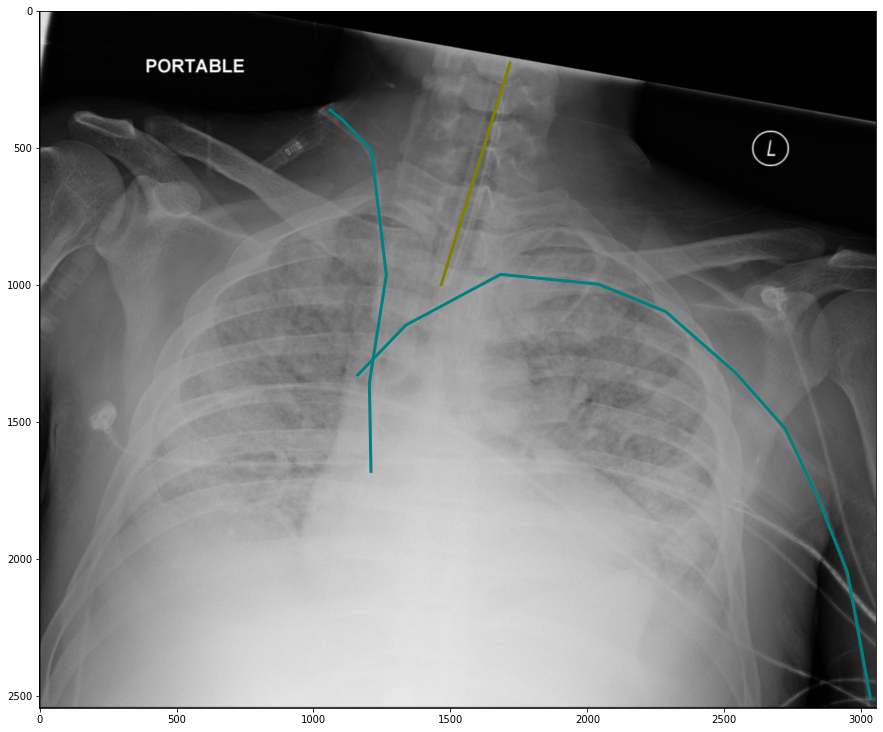

CVC - Normal
CVC - Normal
ETT - Normal
NGT - Incompletely Imaged


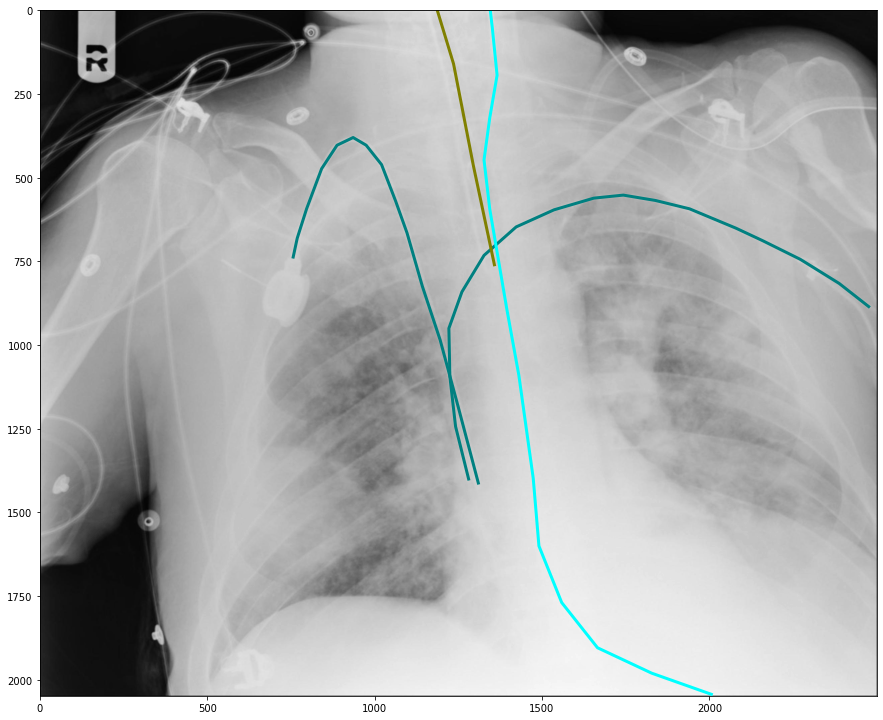

CVC - Normal
CVC - Normal
ETT - Normal


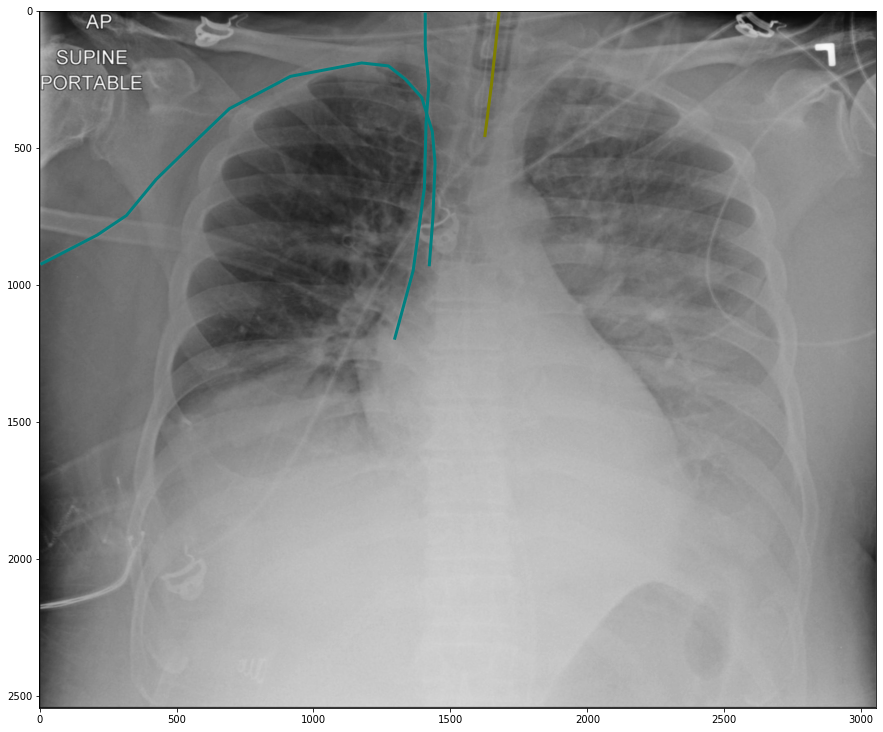

f3/1.2.826.0.1.3680043.8.498.11409973134529266656583367150961222840.json
Swan Ganz Catheter Present


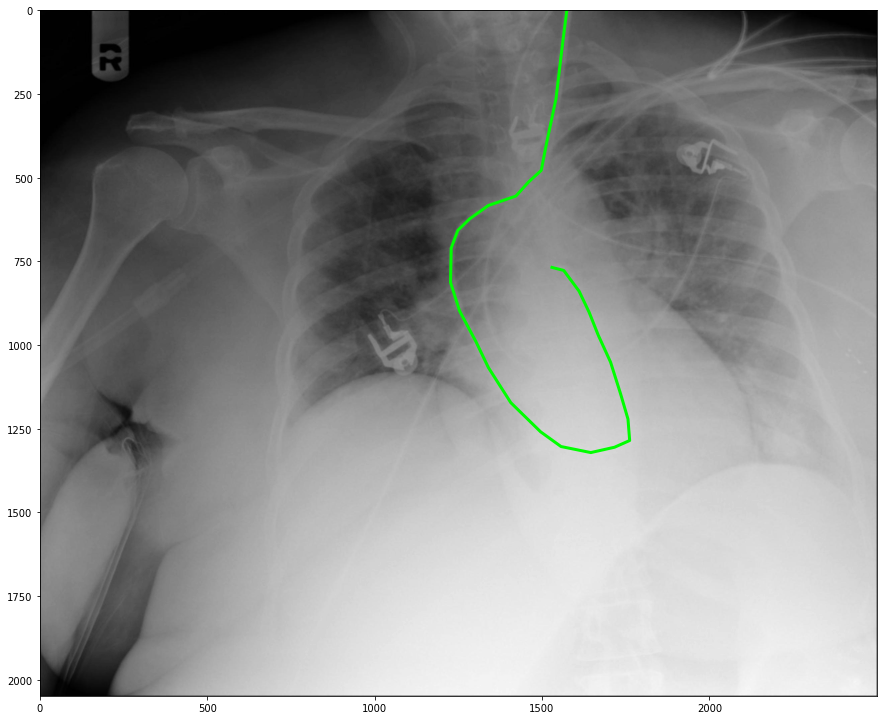

In [66]:
for i in f3.img_id:
    annots = (seg_df[seg_df['StudyInstanceUID'] == i])
    if not (annots.empty):
        file_path = 'f3/'+i+'.jpg'
        img = Image.open(file_path)
        plt.figure(figsize=(15,15))
        plt.imshow(img, cmap='gray')
        for j,annotsdata in enumerate(annots.data):
            label = annots.iloc[j].label
            jsonfile = file_path.replace('.jpg','.json')
            if(os.path.exists(jsonfile)):
                print(jsonfile)
                data = json.load(open(jsonfile,'r'))
#                 input()
            print(label)
            ans = eval(annotsdata)
            xx, yy = map(list, zip(*ans)) 
            plt.plot(xx,yy,color = COLOR_MAP[label], lw =  3*SIZE_MAP[label])
#             input()
        plt.show()


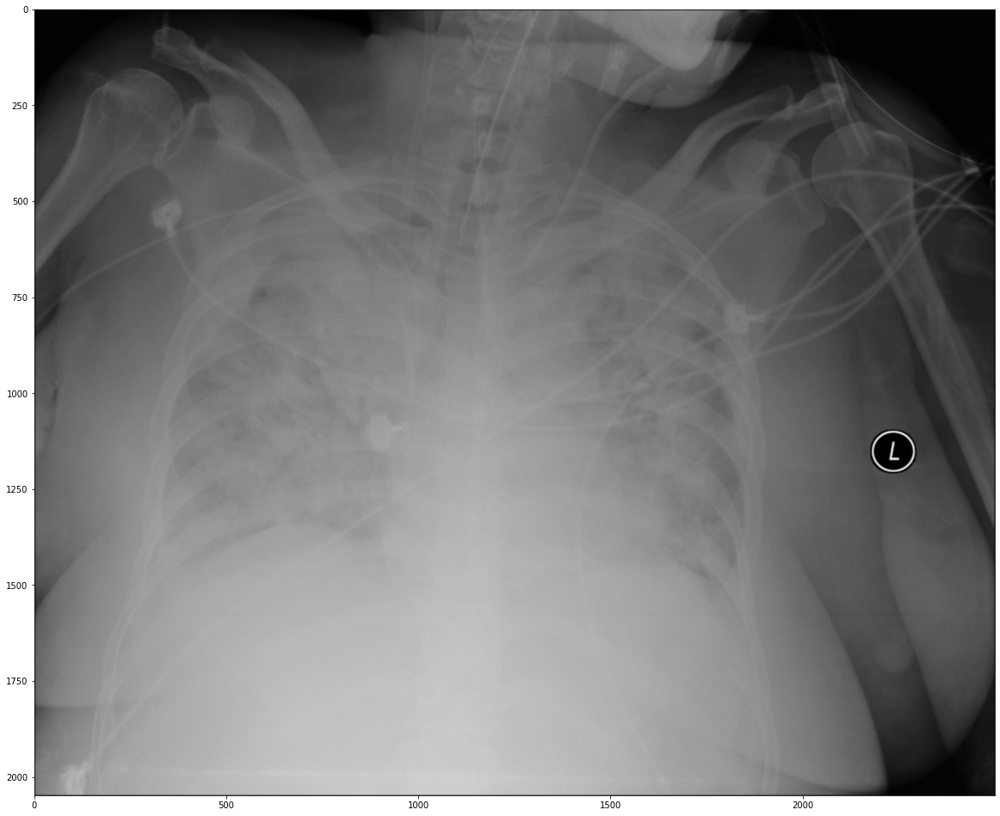

In [210]:
ff = 'E:/dev/ranzcr/f3/1.2.826.0.1.3680043.8.498.11340020173918279713425369739043492051.jpg'
ig = Image.open(ff)
plt.figure(figsize=(20,20))
plt.imshow(ig, cmap='gray')

# Sharpen
sharpen = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

In [208]:
from scipy.signal import convolve2d
kernel = sharpen
ig = convolve2d(ig, kernel, 'same', boundary = 'fill',fillvalue = 0)

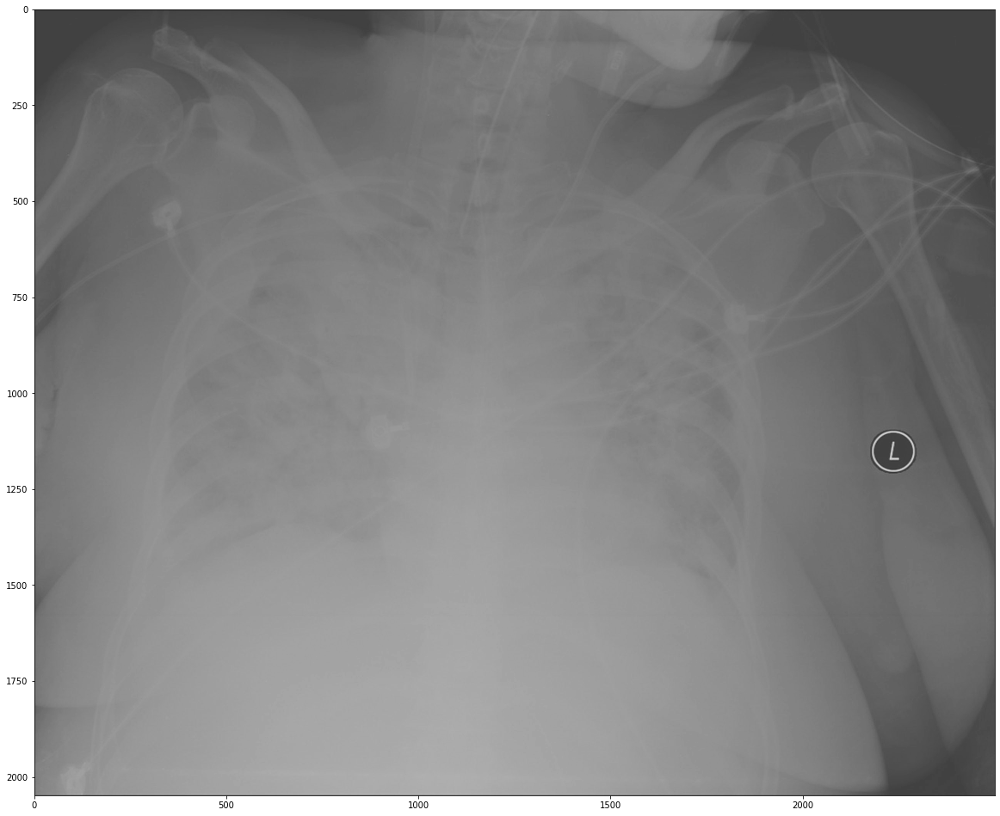

In [209]:
plt.figure(figsize=(20,20))
plt.imshow(ig, cmap='gray')

In [37]:
seg_df

,StudyInstanceUID,label,data
0,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1487, 1279], [1477, 1168], [1472, 1052], [14..."
1,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1328, 7], [1347, 101], [1383, 193], [1400, 2..."
2,1.2.826.0.1.3680043.8.498.72921907356394389969...,CVC - Borderline,"[[801, 1207], [812, 1112], [823, 1023], [842, ..."
3,1.2.826.0.1.3680043.8.498.11697104485452001927...,CVC - Normal,"[[1366, 961], [1411, 861], [1453, 751], [1508,..."
4,1.2.826.0.1.3680043.8.498.87704688663091069148...,NGT - Normal,"[[1862, 14], [1845, 293], [1801, 869], [1716, ..."
...,...,...,...
17994,1.2.826.0.1.3680043.8.498.18590666552942008211...,ETT - Normal,"[[1489, 631], [1515, 571], [1563, 535], [1596,..."
17995,1.2.826.0.1.3680043.8.498.18590666552942008211...,CVC - Normal,"[[1250, 1105], [1247, 1031], [1248, 970], [126..."
17996,1.2.826.0.1.3680043.8.498.66774579023475418162...,CVC - Normal,"[[1379, 1402], [1389, 1233], [1386, 1137], [13..."
17997,1.2.826.0.1.3680043.8.498.18560506324214035535...,CVC - Normal,"[[1302, 1543], [1308, 1488], [1317, 1355], [13..."


In [44]:
data['shapes']

[{'label': 'Swan',
  'points': [[1079.3225806451612, 9.322580645161338],
   [1080.9354838709678, 151.25806451612902],
   [1061.5806451612902, 338.35483870967744],
   [1013.1935483870968, 673.8387096774193],
   [937.3870967741935, 956.0967741935483],
   [876.0967741935484, 1173.8387096774193],
   [863.1935483870968, 1283.516129032258],
   [908.3548387096774, 1401.258064516129],
   [974.483870967742, 1477.0645161290322],
   [1024.483870967742, 1517.3870967741937],
   [1084.1612903225807, 1523.8387096774195],
   [1156.741935483871, 1506.0967741935483],
   [1235.774193548387, 1465.774193548387],
   [1301.9032258064517, 1378.6774193548388],
   [1372.8709677419356, 1262.5483870967741],
   [1374.483870967742, 1180.2903225806451],
   [1359.967741935484, 1104.483870967742],
   [1318.032258064516, 1006.0967741935483],
   [1285.774193548387, 967.3870967741937],
   [1247.0645161290322, 941.5806451612902],
   [1180.9354838709678, 927.0645161290322],
   [1113.1935483870968, 925.4516129032259],
   [1

In [42]:
f3dir = 'E:/dev/ranzcr/f3/'
import os
import json
for ff in os.listdir(f3dir):
    if('json' in ff):
        if(seg_df[seg_df['StudyInstanceUID']==ff[:-5]].empty):
            data = json.load(open(f3dir + ff, 'r'))

# data = json.load(open(f3dir+ '1.2.826.0.1.3680043.8.498.10310219340181948256027556295464624085.json', 'r'))

,StudyInstanceUID,label,data
0,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1487, 1279], [1477, 1168], [1472, 1052], [14..."
1,1.2.826.0.1.3680043.8.498.12616281126973421762...,CVC - Normal,"[[1328, 7], [1347, 101], [1383, 193], [1400, 2..."
2,1.2.826.0.1.3680043.8.498.72921907356394389969...,CVC - Borderline,"[[801, 1207], [812, 1112], [823, 1023], [842, ..."
3,1.2.826.0.1.3680043.8.498.11697104485452001927...,CVC - Normal,"[[1366, 961], [1411, 861], [1453, 751], [1508,..."
4,1.2.826.0.1.3680043.8.498.87704688663091069148...,NGT - Normal,"[[1862, 14], [1845, 293], [1801, 869], [1716, ..."
...,...,...,...
17994,1.2.826.0.1.3680043.8.498.18590666552942008211...,ETT - Normal,"[[1489, 631], [1515, 571], [1563, 535], [1596,..."
17995,1.2.826.0.1.3680043.8.498.18590666552942008211...,CVC - Normal,"[[1250, 1105], [1247, 1031], [1248, 970], [126..."
17996,1.2.826.0.1.3680043.8.498.66774579023475418162...,CVC - Normal,"[[1379, 1402], [1389, 1233], [1386, 1137], [13..."
17997,1.2.826.0.1.3680043.8.498.18560506324214035535...,CVC - Normal,"[[1302, 1543], [1308, 1488], [1317, 1355], [13..."


In [ ]:
seg

In [31]:
f3[f3['img_id']=='1.2.826.0.1.3680043.8.498.10310219340181948256027556295464624085']

,discrepancy,img_id,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
111,model_disagrees_with_cvc_present,1.2.826.0.1.3680043.8.498.10310219340181948256...,0,0,0,0,0,0,1,0,0,1,0


In [27]:
data['shapes']

[{'label': 'CVC',
  'points': [[842.7179487179487, 1017.2051282051282],
   [922.2051282051282, 900.5384615384615],
   [999.1282051282051, 744.1282051282051],
   [1042.7179487179487, 654.3846153846154],
   [1095.2820512820513, 605.6666666666666],
   [1173.4871794871794, 591.5641025641025],
   [1265.7948717948718, 637.7179487179487],
   [1306.8205128205127, 732.5897435897435],
   [1329.8974358974358, 928.7435897435897],
   [1326.051282051282, 1114.6410256410256],
   [1340.1538461538462, 1303.102564102564],
   [1373.4871794871792, 1546.6923076923076],
   [1373.4871794871792, 1546.6923076923076]],
  'group_id': None,
  'shape_type': 'polygon',
  'flags': {}},
 {'label': 'CVC',
  'points': [[1902.974358974359, 46.69230769230769],
   [1850.4102564102564, 153.1025641025641],
   [1840.1538461538462, 247.97435897435895],
   [1755.5384615384614, 363.35897435897436],
   [1715.7948717948716, 481.30769230769226],
   [1694.0, 667.2051282051282],
   [1654.2564102564102, 776.1794871794872],
   [1596.5

In [229]:
from scipy import misc, ndimage
face = ig
blurred_f = ndimage.gaussian_filter(face, 3)
filter_blurred_f = ndimage.gaussian_filter(blurred_f, 1)
alpha = 25
sharpened = blurred_f + alpha * (blurred_f - filter_blurred_f)

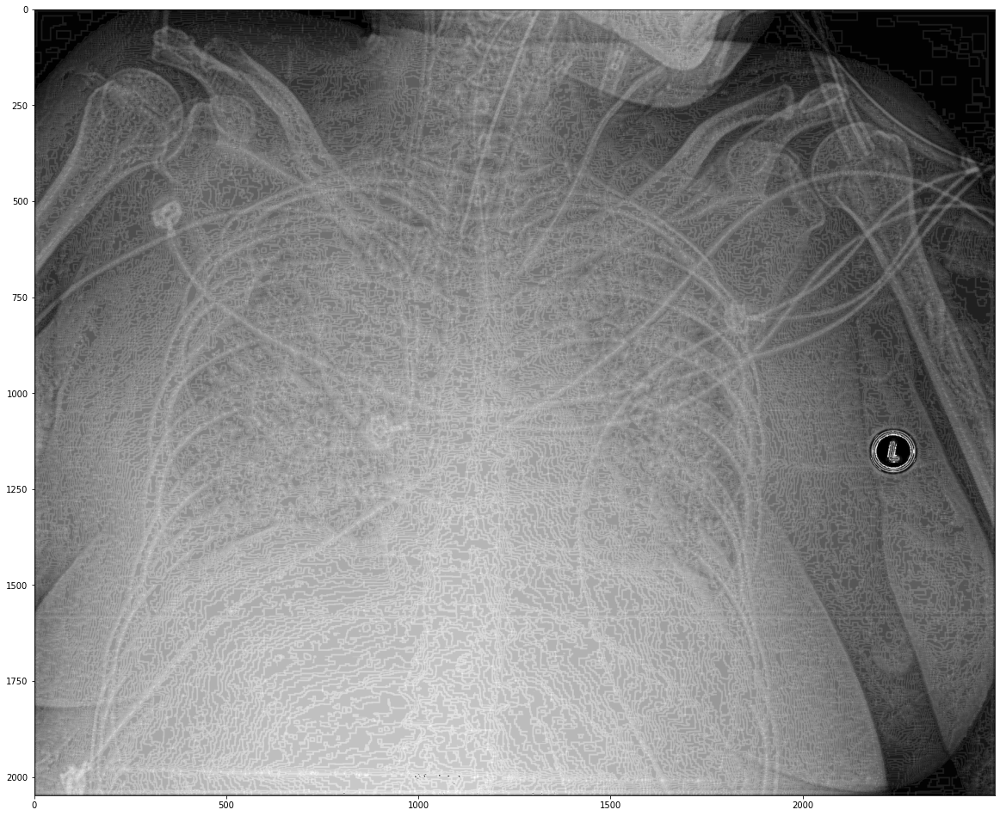

In [230]:
plt.figure(figsize=(20,20))
plt.imshow(face,cmap='gray')
plt.imshow(sharpened,cmap='gray')